# Лабораторная работа №3. Синтез БИХ-фильтров

__Вариант 6__


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

import sympy as sym

## Модуль 1. Метод размещения нулей и полюсов.


### Задача 1.1 Синтез цифрового резонатора

| Варианты: |   $1$ |    $2$ |    $3$ |    $4$ |    $5$ |    $6$ |     $7$ |    $8$ |    $9$ |    $10$ | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|
|  $\nu_0$  | $0.25$ | $0.2$ | $0.1$ |  $—$ | $—$ | $—$ | $0.3$ | $0.15$ | $0.35$ | $0.4$ |
|$\theta_0$ | $—$ | $—$ | $—$ | $\dfrac\pi6$ | $\dfrac\pi3$ | $\dfrac\pi2$ |  $—$ | $—$ | $—$ | $—$ |

Синтезировать методом размещения нулей и полюсов цифровой резонатор для частоты $\nu_0$ или $\theta_0$ (в зависимости от варианта). Параметр, влияющий на добротность резонатора, подобрать самостоятельно.

* Построить нуль-полюсную диаграмму получившегося фильтра.
* Записать передаточную функцию $H(z)$.
* Вычислить аналитически импульсную и переходную характеристики и сравнить с результатами моделирования.
* Исследовать фильтр на устойчивость по входу.
* Изобразить блок-схему фильтра.
* Построить АЧХ и ФЧХ фильтра.
* Сравнить АЧХ с $H(z)$.

In [2]:
# nu_0 = 0.25
theta = np.pi / 2
a = 0.8  # параметр, влияющий на добротность

zeros = np.array((-1, 1))
poles = np.array((a*np.exp(1j*theta), a*np.exp(-1j*theta)))

z0 = np.exp(1j * theta)
G0 = np.abs((1 - (z0)**(-2)) / (1 - 2*a*np.cos(theta) * (z0)**(-1) + a**2 * (z0)**(-2)))**(-1)# gain

system = signal.dlti(zeros, poles, G0, dt=1)
w, H = signal.dfreqresp(system, w=np.linspace(-np.pi, np.pi, 1024))

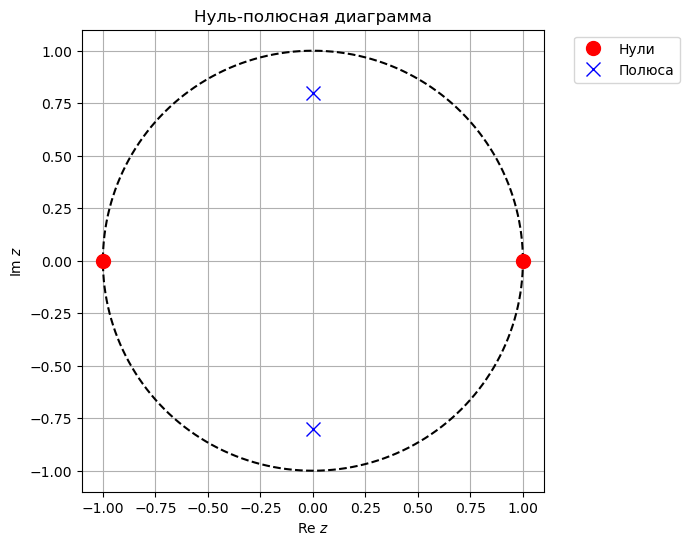

In [3]:
q = np.linspace(0, 2*np.pi, 401)
fig = plt.figure(figsize=[6, 6])
fig.patch.set_facecolor('white')
plt.plot(np.cos(q), np.sin(q), 'k--')  
plt.plot(zeros.real, zeros.imag, 'ro', markersize=10, label='Нули')
plt.plot(poles.real, poles.imag, 'bx', markersize=10, label='Полюса')
plt.grid()
plt.axis('image')
plt.axis([-1.1, 1.1, -1.1, 1.1])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, numpoints=1)
plt.title("Нуль-полюсная диаграмма")
plt.xlabel("Re $z$")
plt.ylabel("Im $z$")
plt.show()

In [4]:
def Hz(z, zs, ps, k):
    res = k
    for zero in zs:
        res *= (z-zero)
    for pole in ps:
        res /= (z-pole)
    return res

H_res = lambda z: Hz(z, zeros, poles, G0)

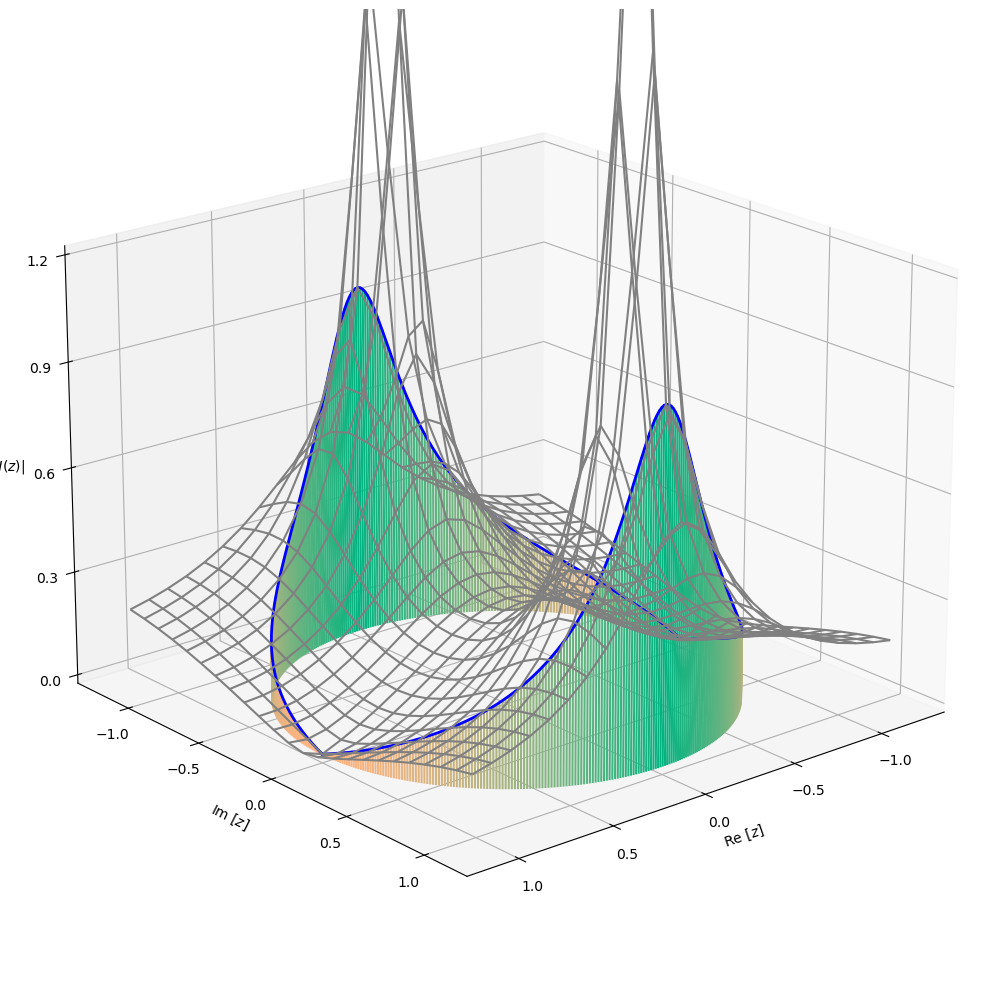

In [5]:
fig = plt.figure(figsize=[10, 10])
fig.patch.set_facecolor('white')
ax = plt.axes(projection='3d')
Re=np.arange(-1.2, 1.2, 0.1)
Im=np.arange(-1.2, 1.2, 0.1)
Re, Im = np.meshgrid(Re, Im)
Z1=(Re+1j*Im)
Z=abs(H_res(Z1))
Z=np.minimum(Z, 3*np.ones(Z.shape))

phi=np.linspace(0, 2*np.pi, 500)
#ax.plot_surface(Re, Im, Z, linewidth=0, antialiased=True, color='silver')
ax.plot_wireframe(Re, Im, Z, color='grey')

for u in phi:
    Z1=np.exp(-1j*u)
    Z2=abs(H_res(Z1))
    ax.plot([Z1.real, Z1.real], [Z1.imag, Z1.imag], [0.0, Z2],  color=(abs(np.cos(u)), 0.7, 0.5))

Z1=np.exp(-1j*phi)
Z2=abs(H_res(Z1))

ax.plot(Z1.real, Z1.imag, Z2, linewidth=2, color='b')

ax.set_zlim(0,1.2)
ax.set_xticks(np.linspace(-1, 1, 5))
ax.set_yticks(np.linspace(-1, 1, 5))
ax.set_zticks(np.linspace(0, 1.2, 5))
ax.view_init(20, 50)
ax.set_xlabel("Re [$z$]")
ax.set_ylabel("Im [$z$]")

ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel("$|H(z)|$   ", rotation=0)
plt.tight_layout()

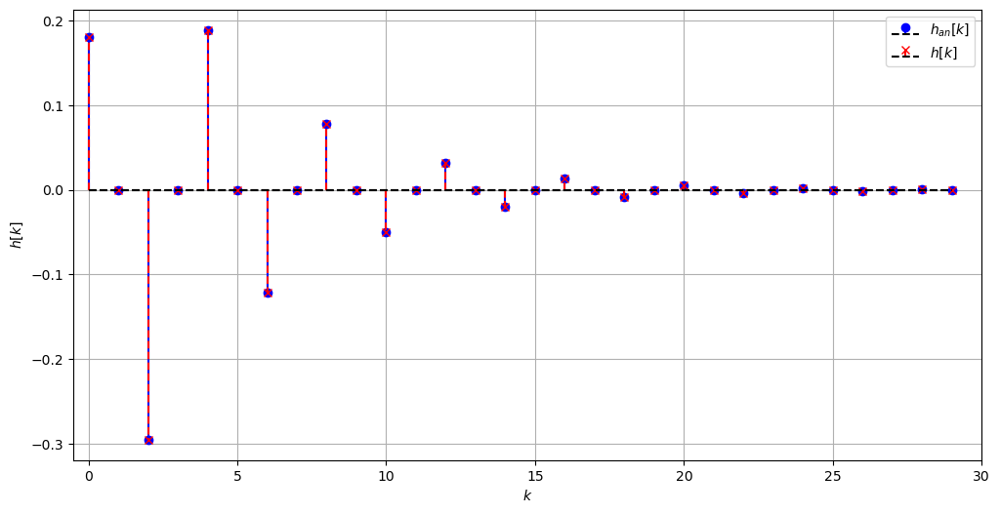

In [6]:
n = np.arange(30)

# вывод см лекция 7, слайд 15, формула 9 (здесь 2 слагаемых, одно задержано на 2 такта (z^(-2)))
h_an = G0 * a**(n  ) * np.sin((n+1  )*theta) / np.sin(theta) - \
       G0 * a**(n-2) * np.sin((n+1-2)*theta) / np.sin(theta) * np.heaviside(np.arange(30)-2, 1) 
            
t, h = signal.dimpulse(system, n=30)

fig = plt.figure(figsize=(12,6))
fig.patch.set_facecolor('white')

plt.stem(t, h_an, linefmt='b', basefmt = 'k--', markerfmt = 'bo', label="$h_{an}[k]$")
plt.stem(t, np.squeeze(h), linefmt='r--', basefmt = 'k--', markerfmt = 'rx', label="$h[k]$")

plt.xlim(-0.5, 30)
plt.xlabel("$k$")
plt.ylabel("$h[k]$")
plt.legend(loc = 'best')
plt.grid()
plt.show()

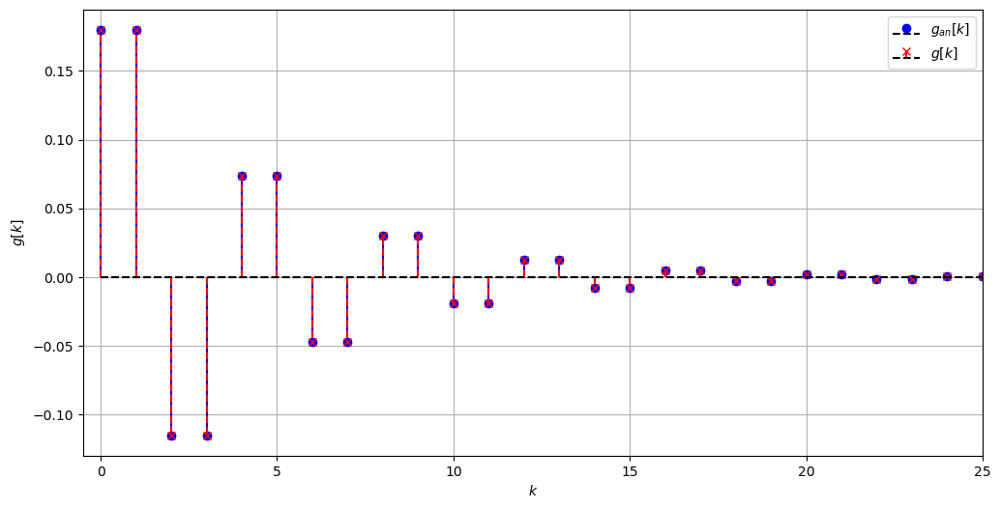

In [7]:
n = np.arange(30)

# вывод как для h, но для H(z) * 1 / (1-z^(-1))  
g_an = G0 * a**(n  ) * np.sin((n+1  )*theta) / np.sin(theta) + \
       G0 * a**(n-1) * np.sin((n+1-1)*theta) / np.sin(theta) * np.heaviside(np.arange(30)-1, 1) 

t, g = signal.dstep(system, n=30)

fig = plt.figure(figsize=(12,6))
fig.patch.set_facecolor('white')

plt.stem(t, g_an, linefmt='b', basefmt = 'k--', markerfmt = 'bo', label="$g_{an}[k]$")
plt.stem(t, np.squeeze(g), linefmt='r--', basefmt = 'k--', markerfmt = 'rx', label="$g[k]$")

plt.xlim(-0.5, 25)
plt.xlabel("$k$")
plt.ylabel("$g[k]$")
plt.legend(loc = 'best')
plt.grid()
plt.show()

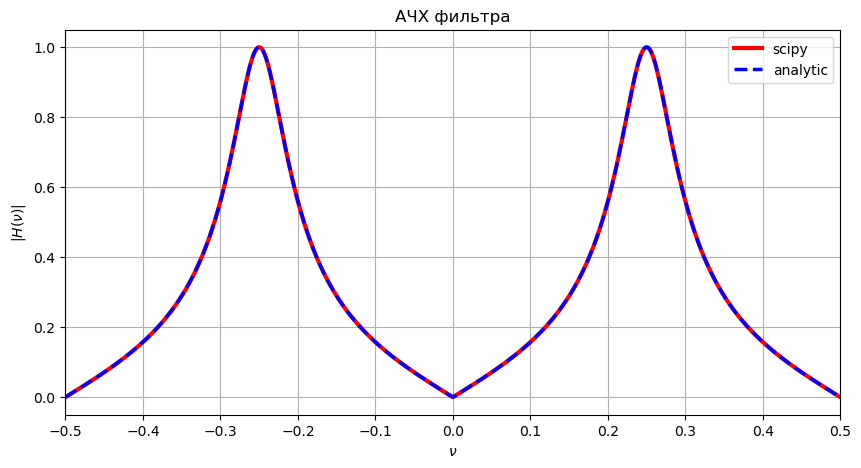

In [8]:
# H(z), z = np.exp(1j*w)
H_an = G0 * (1 - np.exp(-2*1j*w)) / (1 - 2*a*np.cos(theta)*np.exp(-1j*w) + a**2 * np.exp(-2*1j*w))

fig = plt.figure(figsize=[10, 5])
plt.plot(w/(2*np.pi), abs(H), lw=3, ls='-', color='r', label="scipy")
plt.plot(w/(2*np.pi), abs(H_an), lw=2.5, ls='--', color='b', label="analytic")
plt.legend(loc='best')
plt.xlabel("$\\nu$")
plt.ylabel("$|H(\\nu)|$")
plt.title("АЧХ фильтра")
plt.xlim([-0.5, 0.5])
plt.xticks(np.linspace(-0.5, 0.5, 11))
plt.grid()
plt.show()

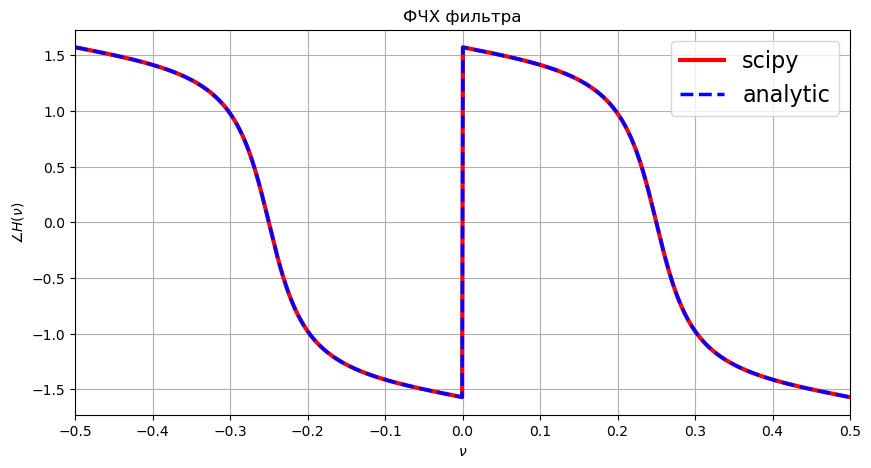

In [9]:
fig = plt.figure(figsize=[10, 5])
plt.plot(w/(2*np.pi), np.angle(H), lw=3, ls='-', color='r', label="scipy")
plt.plot(w/(2*np.pi), np.angle(H_an), lw=2.5, ls='--', color='b', label="analytic")
plt.legend(loc='upper right', fontsize=16)
plt.xlabel("$\\nu$")
plt.ylabel(r"$\angle H(\nu)$")
plt.title("ФЧХ фильтра")
plt.xlim([-0.5, 0.5])
plt.xticks(np.linspace(-0.5, 0.5, 11))
plt.grid()
plt.show()

### Задача 1.2 Синтез цифрового фильтра Hum removal

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 |    7 |    8 |    9 |   10 |  
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|
|  $f_0$, Гц  | 250 | 350 | 400 |  200 | 100 | 150 | 250 | 500| 600 | 350 |
|  $f_д$, Гц | 1000 | 1000 | 1000 | 500 | 500 | 500 | 1000 | 2000 | 2000 | 2000 |

Синтезировать методом размещения нулей и полюсов цифровой фильтр Hum removal  для частоты $f_{0}$, $f_{д}$. Параметр, влияющий на добротность, подобрать самостоятельно.

* Записать передаточную функцию $H(z)$.
* Исследовать фильтр на устойчивость по входу.
* Изобразить блок-схему фильтра.
* Построить АЧХ и ФЧХ фильтра.
* Сравнить АЧХ с $H(z)$.


In [10]:
f0 = 150
fs = 500
nu_0 = f0 / fs
theta = 2 * np.pi * nu_0
a = 0.9

zeros = np.array((np.exp(1j*theta), np.exp(-1j*theta)))
poles = a * zeros

G0 = np.abs((1 - 2*np.cos(theta) * (z0)**(-1) + (z0)**(-2))/ (1 - 2*a*np.cos(theta) * (z0)**(-1) + a**2 * (z0)**(-2)))**(-1)

system = signal.dlti(zeros, poles, G0, dt=1)
w, H = signal.dfreqresp(system, w=np.linspace(-np.pi, np.pi, 1024))

In [11]:
G0

0.9510578462921546

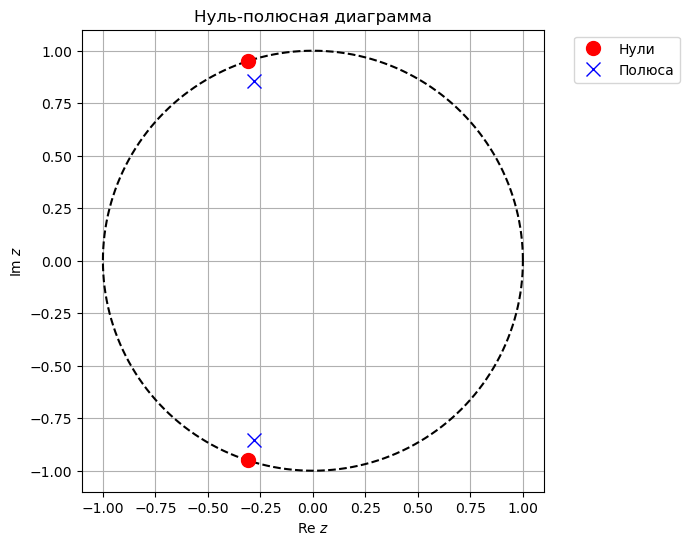

In [12]:
q = np.linspace(0, 2*np.pi, 401)
fig = plt.figure(figsize=[6, 6])
fig.patch.set_facecolor('white')
plt.plot(np.cos(q), np.sin(q), 'k--')  
plt.plot(zeros.real, zeros.imag, 'ro', markersize=10, label='Нули')
plt.plot(poles.real, poles.imag, 'bx', markersize=10, label='Полюса')
plt.grid()
plt.axis('image')
plt.axis([-1.1, 1.1, -1.1, 1.1])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, numpoints=1)
plt.title("Нуль-полюсная диаграмма")
plt.xlabel("Re $z$")
plt.ylabel("Im $z$")
plt.show()

In [13]:
H_res = lambda z: Hz(z, zeros, poles, G0)

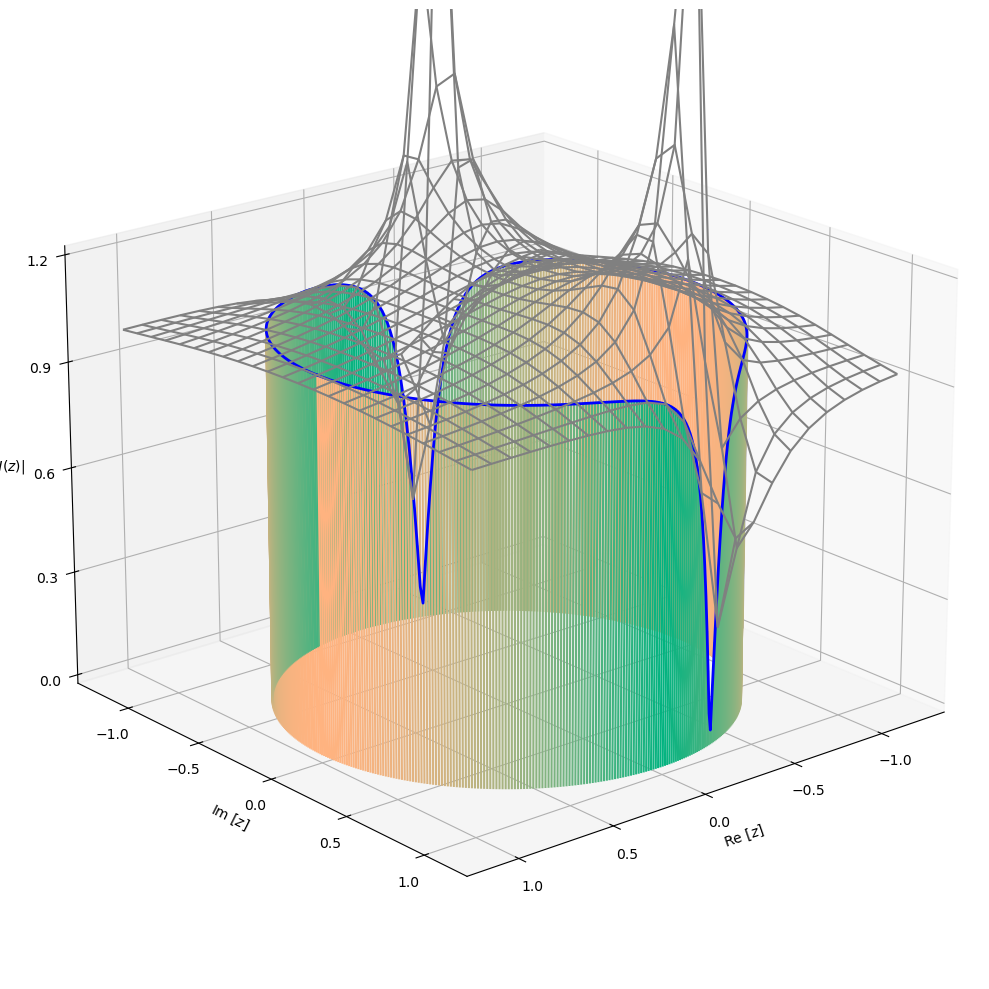

In [14]:
fig = plt.figure(figsize=[10, 10])
fig.patch.set_facecolor('white')
ax = plt.axes(projection='3d')
Re=np.arange(-1.2, 1.2, 0.1)
Im=np.arange(-1.2, 1.2, 0.1)
Re, Im = np.meshgrid(Re, Im)
Z1=(Re+1j*Im)
Z=abs(H_res(Z1))
Z=np.minimum(Z, 3*np.ones(Z.shape))

phi=np.linspace(0, 2*np.pi, 500)
#ax.plot_surface(Re, Im, Z, linewidth=0, antialiased=True, color='silver')
ax.plot_wireframe(Re, Im, Z, color='grey')

for u in phi:
    Z1=np.exp(-1j*u)
    Z2=abs(H_res(Z1))
    ax.plot([Z1.real, Z1.real], [Z1.imag, Z1.imag], [0.0, Z2],  color=(abs(np.cos(u)), 0.7, 0.5))

Z1=np.exp(-1j*phi)
Z2=abs(H_res(Z1))

ax.plot(Z1.real, Z1.imag, Z2, linewidth=2, color='b')

ax.set_zlim(0,1.2)
ax.set_xticks(np.linspace(-1, 1, 5))
ax.set_yticks(np.linspace(-1, 1, 5))
ax.set_zticks(np.linspace(0, 1.2, 5))
ax.view_init(20, 50)
ax.set_xlabel("Re [$z$]")
ax.set_ylabel("Im [$z$]")

ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel("$|H(z)|$   ", rotation=0)
plt.tight_layout()

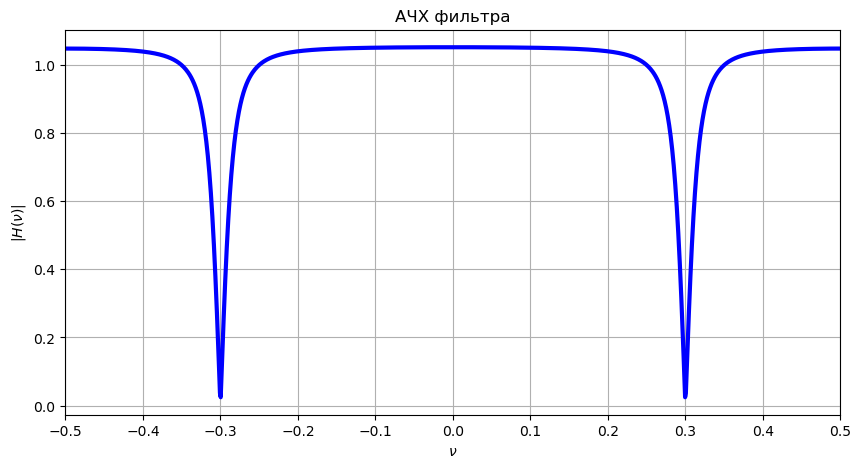

In [15]:
fig = plt.figure(figsize=[10, 5])
fig.patch.set_facecolor('white')
plt.plot(w/(2*np.pi), abs(H), lw=3, ls='-', color='b', label="scipy")
#plt.plot(w/(2*np.pi), abs(H_an), lw=2.5, ls='--', color='b', label="handmade")
#plt.legend(loc='best')
plt.xlabel("$\\nu$")
plt.ylabel("$|H(\\nu)|$")
plt.title("АЧХ фильтра")
plt.xlim([-0.5, 0.5])
plt.xticks(np.linspace(-0.5, 0.5, 11))
plt.grid()
plt.show()

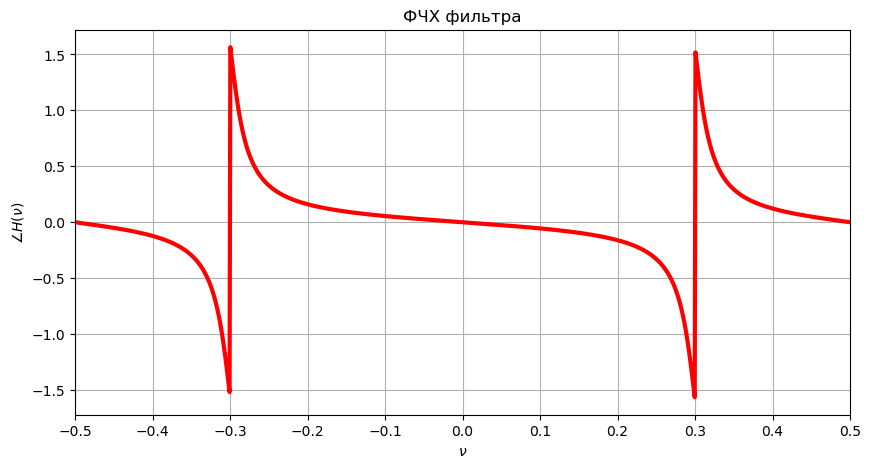

In [16]:
fig = plt.figure(figsize=[10, 5])
fig.patch.set_facecolor('white')
plt.plot(w/(2*np.pi), np.angle(H), lw=3, ls='-', color='r')
#plt.plot(w/(2*np.pi), np.angle(H_an), lw=2.5, ls='--', color='b', label="handmade")
#plt.legend(loc='upper right', fontsize=16)
plt.xlabel("$\\nu$")
plt.ylabel("$\\angle H(\\nu)$")
plt.title("ФЧХ фильтра")
plt.xlim([-0.5, 0.5])
plt.xticks(np.linspace(-0.5, 0.5, 11))
plt.grid()
plt.show()

## Модуль 2. Метод билинейного *z*-преобразования

### Задача 2.1 Синтез фильтра нижних частот (ФНЧ)

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 |    7 |    8 |    9 |    10 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|
|  $f_д$, Гц  | 6000 | 6200 | 6400 |  6600 | 6800 | 7000 | 6200 | 6400 |  6600 | 6800 |
|  $f_1$, Гц | 800 | 860 | 920 | 980 | 1040 | 1100 | 860 | 920 | 980 | 1040 |
|  $f_2$, Гц | 1100 | 1170 | 1240 | 1310 | 1380 | 1450 |1170 | 1240 | 1310 | 1380 |
|  $a_{\max}$, дБ | 0.4455 | 0.4455 | 0.4455 | 0.4455 | 0.4455 | 0.4455 |0.4455 | 0.4455 | 0.4455 | 0.4455 |
|  $a_{\min}$, дБ | 40 | 40 | 40 | 40 | 40 | 40 |40 | 40 | 40 | 40 |

 Получить коэффициенты разностного уравнения БИХ-фильтра нижних частот со следующими характеристиками:
* частота дискретизации $f_{д}$, 
* граничная частота полосы пропускания $f_1$,
* граничная частота полосы задерживания $f_2$,
* максимальное допустимое затухание в полосе пропускания $ a_{\max} $,
* минимальное допустимое затухание в полосе задерживания $ a_{\min} $.

Воспользоваться методом билинейного z-преобразования для фильтров: 

1) Баттервота,

2) Чебышёва 1 рода,

3) Чебышёва 2 рода,

4) Золотарёва—Кауэра.

Из четырех получившихся результатов выбрать фильтр, обладающий наименьшим порядком $N$ и построить схему его реализации в виде каскада биквадратных блоков. Для биквадратных блоков выбрать прямую каноническую реализацию. 


In [17]:
# Опредление набора параметров 
fs = 7000 # частота дискретизации 
f1 = 1100 # граничная частота полосы пропускания
f2 = 1450 # граничная частота полосы задерживания
gpass=0.4455 # максимальное допустимое затухание в полосе пропускания в дБ
gstop=40 # минимальное допустимое затухание в полосе задерживания в дБ
wp, ws = f1, f2

Фильтр Баттерворта

In [18]:
N_butter, Wn_butter = signal.buttord(wp=wp, ws=ws, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta_butter, alpha_butter = signal.butter(N_butter, Wn=Wn_butter, btype='lowpass', analog=False, output='ba', fs=fs)
print("Порядок фильтра ", N_butter)
print("Частота среза %.2f Гц" % Wn_butter)
beta_butter, alpha_butter

Порядок фильтра  17
Частота среза 1161.94 Гц


(array([1.96745911e-07, 3.34468049e-06, 2.67574439e-05, 1.33787219e-04,
        4.68255268e-04, 1.21746370e-03, 2.43492739e-03, 3.82631448e-03,
        4.78289310e-03, 4.78289310e-03, 3.82631448e-03, 2.43492739e-03,
        1.21746370e-03, 4.68255268e-04, 1.33787219e-04, 2.67574439e-05,
        3.34468049e-06, 1.96745911e-07]),
 array([ 1.00000000e+00, -5.70594855e+00,  1.71218905e+01, -3.45501693e+01,
         5.17135502e+01, -6.03048702e+01,  5.63418245e+01, -4.28524093e+01,
         2.67538886e+01, -1.37446201e+01,  5.79508734e+00, -1.98942374e+00,
         5.48229823e-01, -1.18535869e-01,  1.93919085e-02, -2.25904554e-03,
         1.67133678e-04, -5.90702521e-06]))

Фильтр Чебышева I рода

In [19]:
N_cheb1, Wn_cheb1 = signal.cheb1ord(wp=wp, ws=ws, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta_cheb1, alpha_cheb1= signal.cheby1(N=N_cheb1, rp=gpass, Wn=Wn_cheb1, btype='low', analog=False, output='ba', fs=fs)
print("Порядок фильтра ", N_cheb1)
print("Частота среза %.2f Гц" % Wn_cheb1)
beta_cheb1, alpha_cheb1

Порядок фильтра  8
Частота среза 1100.00 Гц


(array([5.52003111e-05, 4.41602489e-04, 1.54560871e-03, 3.09121742e-03,
        3.86402178e-03, 3.09121742e-03, 1.54560871e-03, 4.41602489e-04,
        5.52003111e-05]),
 array([  1.        ,  -5.1083879 ,  12.74154597, -19.83068802,
         20.86571304, -15.12454614,   7.36265366,  -2.20298189,
          0.31156627]))

Фильтр Чебышева II рода

In [20]:
N_cheb2, Wn_cheb2 = signal.cheb2ord(wp=wp, ws=ws, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta_cheb2, alpha_cheb2 = signal.cheby2(N=N_cheb2, rs=gstop, Wn=Wn_cheb2, btype='low', analog=False, output='ba', fs=fs)
print("Порядок фильтра ", N_cheb2)
print("Частота среза %.2f Гц" % Wn_cheb2)
beta_cheb2, alpha_cheb2 

Порядок фильтра  8
Частота среза 1390.96 Гц


(array([0.03649518, 0.04932439, 0.11218386, 0.13359569, 0.15683635,
        0.13359569, 0.11218386, 0.04932439, 0.03649518]),
 array([ 1.        , -1.75811262,  2.5220812 , -1.84955321,  1.17531735,
        -0.38900849,  0.12780845, -0.01102103,  0.00252295]))

Фильтр Золотарева-Кауэра (эллиптический)

In [21]:
N_ellip, Wn_ellip = signal.ellipord(wp=wp, ws=ws, gpass=gpass, gstop=gstop, analog=False, fs=fs)
beta_ellip, alpha_ellip = signal.ellip(N=N_ellip, rp=gpass, rs=gstop, Wn=Wn_ellip, btype='low', analog=False, output='ba', fs=fs)
print("Порядок фильтра ", N_ellip)
print("Частота среза %.2f Гц" % Wn_ellip)
beta_ellip, alpha_ellip

Порядок фильтра  5
Частота среза 1100.00 Гц


(array([0.03293328, 0.01281833, 0.04480283, 0.04480283, 0.01281833,
        0.03293328]),
 array([ 1.        , -2.69322123,  3.82538949, -3.08965326,  1.44694614,
        -0.30835225]))

Наименьший порядок имеет фильтр Золотарева-Кауэра

Амплитудная спецификация фильтров в линейном масштабе

In [22]:
delta_pass = 1 - 10**(-gpass/20)
delta_stop = 10**(-gstop/20)
print(f'delta_pass = {delta_pass}\ndelta_stop = {delta_stop}')

delta_pass = 0.04999694912604835
delta_stop = 0.01


In [23]:
def mag_resp_plot(alpha_dict, beta_dict, delta_pass, delta_stop, fs, wp, ws, gstop, gpass, Wn, dB=False):
    plt.figure(figsize=[10, 5], dpi=100)
    f_Nyquist=fs/2
    
    
    for ((name, alpha), (_, beta)) in zip(alpha_dict.items(), beta_dict.items()):

        f, H = signal.freqz(beta, alpha, worN=np.linspace(-fs/2, fs/2, 1024**2), fs=fs)        
        if dB:
            plt.plot(f, 20*np.log10(abs(H)), label=name)
            plt.ylabel("|H(f)| [дБ]")
        else:
            plt.plot(f, abs(H), label=name)
            plt.ylabel("$|H(f)|$")
            
    if dB:
        plt.plot([-f_Nyquist,-ws], [-gstop, -gstop], '--k')
        plt.plot([f_Nyquist,ws], [-gstop, -gstop], '--k')
        plt.plot([-wp,wp], [-gpass, -gpass], '--k')
        plt.ylim([-gstop*2, 5])
        delta_stop = 20*np.log10(delta_stop)
        
        plt.fill([-wp,-wp, wp, wp], [0, 20*np.log10(1-delta_pass), 20*np.log10(1-delta_pass), 0], '0.9', lw=0)
        plt.fill([-f_Nyquist,-f_Nyquist, -ws, -ws], [delta_stop, 1, 1, delta_stop], '0.9', lw=0)
        plt.fill([f_Nyquist, f_Nyquist, ws, ws], [delta_stop, 1, 1, delta_stop], '0.9', lw=0)
        plt.fill([f_Nyquist, f_Nyquist, ws, ws], [delta_stop, 1, 1, delta_stop], '0.9', lw=0)
        plt.fill([-f_Nyquist,-f_Nyquist, f_Nyquist, f_Nyquist], [1.1, 1, 1, 1.1], '0.9', lw=0)
        plt.fill([-f_Nyquist,-f_Nyquist, f_Nyquist, f_Nyquist], [1.1, 1, 1, 1.1], '0.9', lw=0)
    else:
        plt.fill([-wp,-wp, wp, wp], [0, 1-delta_pass, 1-delta_pass, 0], '0.9', lw=0)
        plt.fill([-f_Nyquist,-f_Nyquist, -ws, -ws], [delta_stop, 1, 1, delta_stop], '0.9', lw=0)
        plt.fill([f_Nyquist, f_Nyquist, ws, ws], [delta_stop, 1, 1, delta_stop], '0.9', lw=0)
        plt.fill([f_Nyquist, f_Nyquist, ws, ws], [delta_stop, 1, 1, delta_stop], '0.9', lw=0)
        plt.fill([-f_Nyquist,-f_Nyquist, f_Nyquist, f_Nyquist], [1.1, 1, 1, 1.1], '0.9', lw=0)
        plt.fill([-f_Nyquist,-f_Nyquist, f_Nyquist, f_Nyquist], [1.1, 1, 1, 1.1], '0.9', lw=0)
    
    plt.xlim([-fs/2, fs/2])
    plt.xticks([-fs/2, -Wn, 0, wp, ws, fs/2])
    plt.xlabel("$f$ [Гц]")
    plt.legend()
    plt.grid()
    plt.tight_layout()

In [24]:
alpha_dict = {
    'butter' : alpha_butter,
    'cheb1' : alpha_cheb1,
    'cheb2' : alpha_cheb2,
    'ellip' : alpha_ellip
}

beta_dict = {
    'butter' : beta_butter,
    'cheb1' : beta_cheb1,
    'cheb2' : beta_cheb2,
    'ellip' : beta_ellip
}

C:\Users\nazmievairat\AppData\Local\Temp\ipykernel_26284\2013029535.py:10: RuntimeWarning: divide by zero encountered in log10
  plt.plot(f, 20*np.log10(abs(H)), label=name)


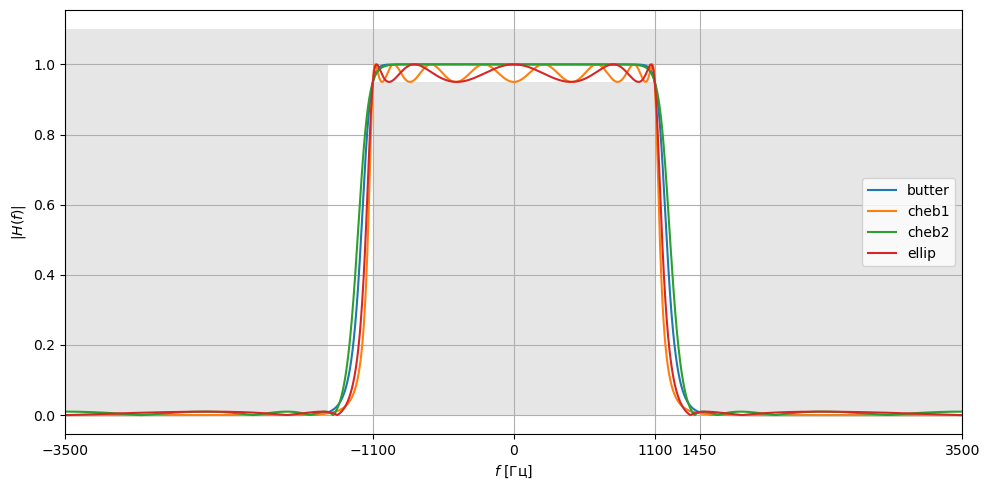

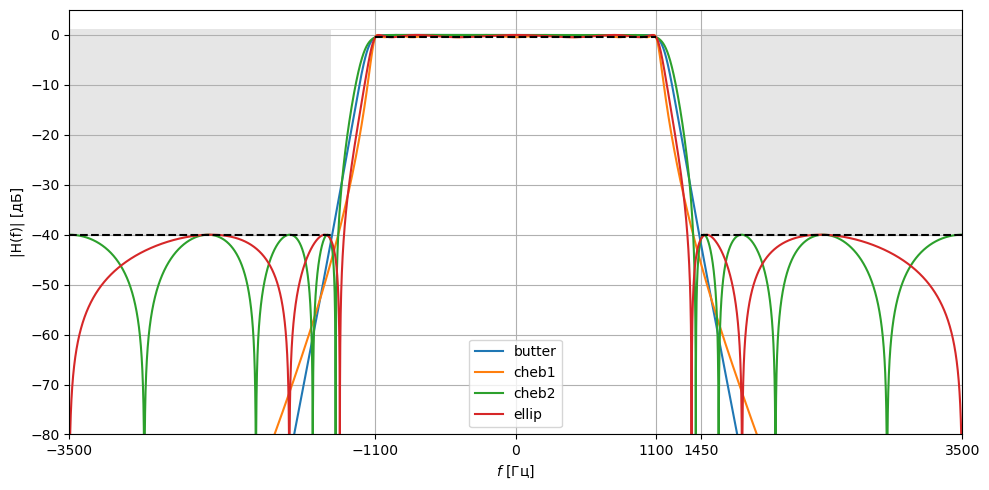

In [25]:
mag_resp_plot(alpha_dict, 
              beta_dict,
              delta_pass=delta_pass,
              delta_stop=delta_stop,
              fs=fs,
              wp=wp,
              ws=ws,
              gstop=gstop,
              gpass=gpass,
              Wn=Wn_ellip,
              dB=False)

mag_resp_plot(alpha_dict, 
              beta_dict,
              delta_pass=delta_pass,
              delta_stop=delta_stop,
              fs=fs,
              wp=wp,
              ws=ws,
              gstop=gstop,
              gpass=gpass,
              Wn=Wn_ellip,
              dB=True)

**Представление в виде каскада биквадратных блоков** (Second-order sections  (SOS) representation)
$$ [\beta_0, \beta_1, \beta_2, 1, \alpha_1, \alpha_2]$$
$$ [a_0, a_1, a_2, 1, -b_1, -b_2]$$

Схема одного из трех последовательно соединенных биквадратных блоков:

<img src="figures/biquad.png" alt="schroeder_reverb" class="bg-primary mb-1" width="600px">

In [26]:
filter_sos = signal.tf2sos(beta_ellip, alpha_ellip)
filter_sos.shape

(3, 6)

In [27]:
filter_sos

array([[ 0.03293328,  0.03293328,  0.        ,  1.        , -0.58662722,
         0.        ],
       [ 1.        ,  0.0439985 ,  1.        ,  1.        , -1.08715379,
         0.58920377],
       [ 1.        , -0.6547773 ,  1.        ,  1.        , -1.01944022,
         0.89211204]])

### Задача 2.2 Синтез аналога двухкаскадного RC-фильтра (I способ)

Построить БИХ фильтр, эквивалентный двум последовательно соединенным RC-цепочкам интегрирующего типа (_соединённым через развязывающий усилитель_), воспользовавшись методом билинейного *z*-преобразования.

Параметры $RC$ и $\Delta t $ выбрать самостоятельно. 
Сравнить частотные и импульсные характеристики  цифровых фильтров и их аналоговых прототипов. 

<img src="diagrams/LPF_RC_2ord.drawio.png" alt="schroeder_reverb" class="bg-primary mb-1" width="600px">

Формула для одного каскада:

$ RC \dfrac{d y_1(t)}{d t} + y_1(t) = x(t) $

Начальное условие для $ y_1(0) = 0 $. Тогда преобрвазование Лапласа для данного уравнение будет иметь вид:

$ RC p Y_1(p) + Y_1(p) = X(p) $

Передаточная функция одного каскада:

$ H_1(p) = \dfrac{Y_1(p)}{X(p)} = \dfrac{1}{1 + RC p} $

Передаточная функция для двух каскадов, разделенных повторителем:

$ H_a(p) = H_1(p) H_1(p) = \dfrac{1}{(1 + RC p)^2} $

Найдем импульсную характеристику системы:

$ h_a(t) = \dfrac{1}{2 \pi j} \displaystyle\oint \limits_{C} H_a(p)\, e^{pt}\, dp = 
           \dfrac{1}{2 \pi j} \displaystyle\oint \limits_{C} \dfrac{1}{(1 + RC p)^2}\, e^{pt}\, dp = 
           \displaystyle\sum\limits_{p_p}\underset{p = p_p}{\mathrm{res}} H_a(p)e^{pt} = \lim_{p \rightarrow -\frac{1}{RC}} \frac{d}{dp} \left[ H_a(p)e^{pt} \left(p + \frac{1}{RC}\right)^2\right] = \frac{t}{(RC)^2} \exp\left(-\frac{t}{RC}\right)$

In [28]:
RC = 2 * 1e-4
dt = RC / 8
print(f'RC={RC}, dt={dt}, 1/dt={1/dt}')
num = [1] 
denom = [RC**2, 2*RC, 1]
LTI = signal.lti(num, denom)
LTI

RC=0.0002, dt=2.5e-05, 1/dt=40000.0


TransferFunctionContinuous(
array([25000000.]),
array([1.0e+00, 1.0e+04, 2.5e+07]),
dt: None
)

$ z = \exp(p \Delta t) $

$ p = \dfrac{1}{\Delta t} \ln(z) \approx \dfrac{2}{\Delta t} \cdot \dfrac{z-1}{z+1} = \dfrac{2}{\Delta t} \cdot \dfrac{1-z^{-1}}{1+z^{-1}}$

In [29]:
alpha = [1, 2, 1],
beta = [(2*RC/dt + 1)**2, (2 - 8*(RC/dt)**2), (2*RC/dt - 1)**2]
DLTI = signal.dlti(alpha, beta, dt=dt)
DLTI

TransferFunctionDiscrete(
array([0.00346021, 0.00692042, 0.00346021]),
array([ 1.        , -1.76470588,  0.77854671]),
dt: 2.5e-05
)

C:\Users\nazmievairat\AppData\Local\Temp\ipykernel_26284\1221752172.py:22: RuntimeWarning: divide by zero encountered in log10
  plt.plot(theta_d/(2*np.pi*dt), 20*np.log10(abs(H_d)), "r", lw=2, ls='--', label="$|H(f)|$")


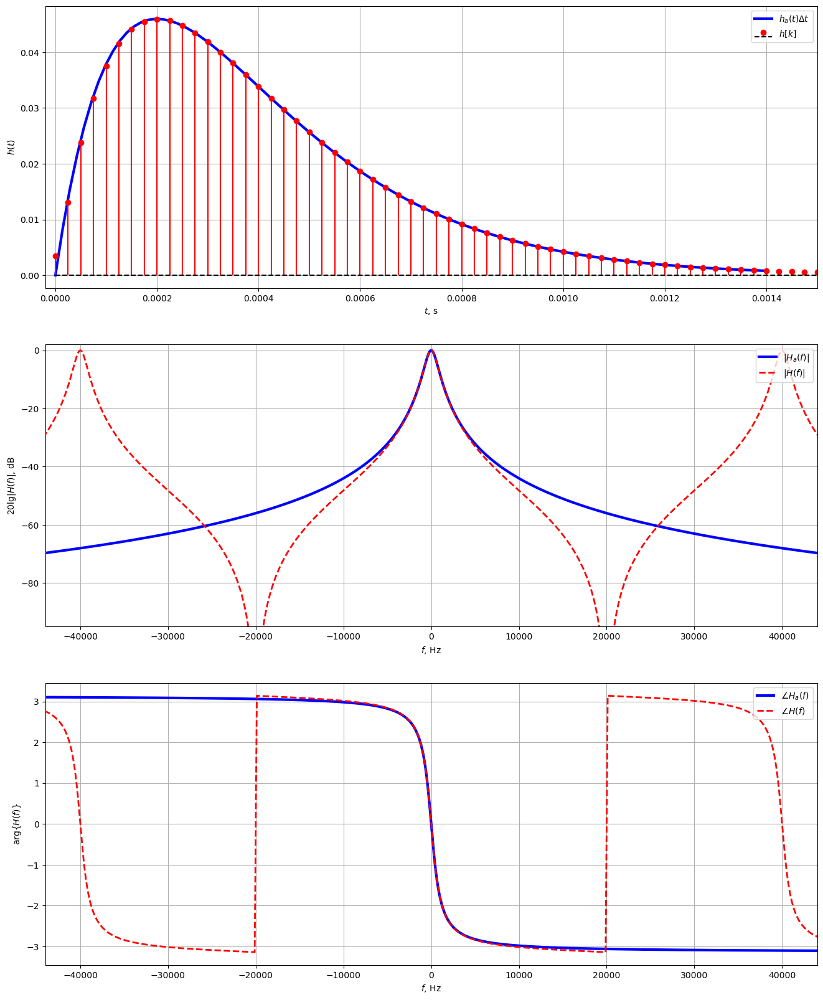

In [30]:
fig = plt.figure(figsize=(16,20))
fig.patch.set_facecolor('white')

plt.subplot(311)
t, h_a = signal.impulse(LTI)
plt.plot(t, h_a*dt, 'b', lw=3, label="$h_a(t) \\Delta t$")

t, h = signal.dimpulse(DLTI, n=100)
plt.stem(t, np.squeeze(h), linefmt='r', basefmt = 'k--', markerfmt = 'ro', label="$h[k]$")

plt.grid()
plt.xlim([-2e-5, 1.5e-3])
plt.xlabel("$t$, s")
plt.ylabel("$h(t)$")
plt.legend(loc = 'upper right')


plt.subplot(312)
w_a, H_a = signal.freqresp(LTI, w=np.linspace(-3*np.pi, 3*np.pi, 1000)/dt)
theta_d, H_d = signal.dfreqresp(DLTI, w=np.linspace(-3*np.pi, 3*np.pi, 1000))
plt.plot(w_a/(2*np.pi), 20*np.log10(abs(H_a)), "b", lw=3, label="$|H_a(f)|$")
plt.plot(theta_d/(2*np.pi*dt), 20*np.log10(abs(H_d)), "r", lw=2, ls='--', label="$|H(f)|$")
plt.ylabel("$20 \lg |H(f)|$, dB")
plt.xlabel("$f$, Hz")
plt.ylim(-95, 2)
plt.xlim(-1.1/dt, +1.1/dt)
plt.legend(loc = 'upper right')
plt.grid()


plt.subplot(313)
plt.plot(w_a/(2*np.pi), np.angle(H_a), "b", lw=3, label="$\\angle H_a(f)$")
plt.plot(theta_d/(2*np.pi*dt), np.angle(H_d), "r", lw=2, ls='--', label="$\\angle H(f)$")
plt.ylabel("arg$\{H(f)\}$")
plt.xlabel("$f$, Hz")
plt.xlim(-1.1/dt, +1.1/dt)
plt.legend(loc = 'upper right')
plt.grid()
plt.show()

## Модуль 3. Метод инвариантной импульсной характеристики.

### Задача 3.1 Синтез аналога двухкаскадного RC-фильтра (II способ)

Построить БИХ фильтр, эквивалентный двум последовательно соединенным RC-цепочкам интегрирующего типа (соединённым через развязывающий усилитель), воспользовавшись методом инвариантной импульсной характеристики.

Параметры $RC$ и $\Delta t $ выбрать самостоятельно. 
Сравнить частотные и импульсные характеристики  цифровых фильтров и их аналоговых прототипов. 

<img src="diagrams/LPF_RC_2ord.drawio.png" alt="schroeder_reverb" class="bg-primary mb-1" width="600px">

Формула для одного каскада:

$ RC \dfrac{d y_1(t)}{d t} + y_1(t) = x(t) $

Начальное условие для $ y_1(0) = 0 $. Тогда преобрвазование Лапласа для данного уравнение будет иметь вид:

$ RC p Y_1(p) + Y_1(p) = X(p) $

Передаточная функция одного каскада:

$ H_1(p) = \dfrac{Y_1(p)}{X(p)} = \dfrac{1}{1 + RC p} $

Передаточная функция для двух каскадов, разделенных повторителем:

$ H_a(p) = H_1(p) H_1(p) = \dfrac{1}{(1 + RC p)^2} $

Найдем импульсную характеристику системы:

$ h_a(t) = \dfrac{1}{2 \pi j} \displaystyle\oint \limits_{C} H_a(p)\, e^{pt}\, dp = 
           \dfrac{1}{2 \pi j} \displaystyle\oint \limits_{C} \dfrac{1}{(1 + RC p)^2}\, e^{pt}\, dp = 
           \displaystyle\sum\limits_{p_p}\underset{p = p_p}{\mathrm{res}} H_a(p)e^{pt} = \lim_{p \rightarrow -\frac{1}{RC}} \frac{d}{dp} \left[ H_a(p)e^{pt} \left(p + \frac{1}{RC}\right)^2\right] = \frac{t}{(RC)^2} \exp\left(-\frac{t}{RC}\right)$

In [31]:
print(f'RC={RC}, dt={dt}, 1/dt={1/dt}')
num = [1] 
denom = [RC**2, 2*RC, 1]
LTI = signal.lti(num, denom)
LTI

RC=0.0002, dt=2.5e-05, 1/dt=40000.0


TransferFunctionContinuous(
array([25000000.]),
array([1.0e+00, 1.0e+04, 2.5e+07]),
dt: None
)

In [32]:
A = dt/RC
alpha = [0, A**2*np.exp(-A), 0]
beta = [1,-2*np.exp(-A), np.exp(-2*A)]
DLTI = signal.dlti(alpha, beta, dt=dt)
DLTI

c:\Users\nazmievairat\anaconda3\lib\site-packages\scipy\signal\_filter_design.py:1746: BadCoefficients: Badly conditioned filter coefficients (numerator): the results may be meaningless
  warnings.warn("Badly conditioned filter coefficients (numerator): the "


TransferFunctionDiscrete(
array([0.01378901, 0.        ]),
array([ 1.        , -1.76499381,  0.77880078]),
dt: 2.5e-05
)

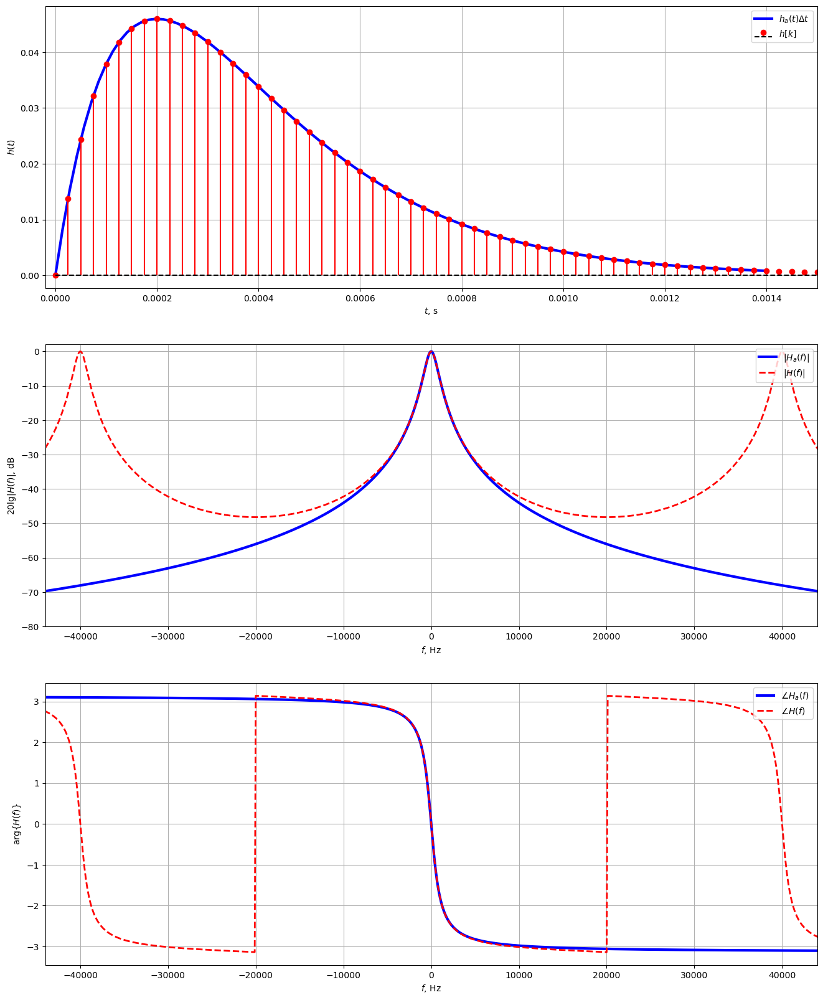

In [33]:
fig = plt.figure(figsize=(16,20))

plt.subplot(311)
t, h_a = signal.impulse(LTI)
plt.plot(t, h_a*dt, 'b', lw=3, label="$h_a(t) \\Delta t$")

t, h = signal.dimpulse(DLTI, n=100)
plt.stem(t, np.squeeze(h), linefmt='r', basefmt = 'k--', markerfmt = 'ro', label="$h[k]$")

plt.grid()
plt.xlim([-2e-5, 1.5e-3])
plt.xlabel("$t$, s")
plt.ylabel("$h(t)$")
plt.legend(loc = 'upper right')

plt.subplot(312)
w_a, H_a = signal.freqresp(LTI, w=np.linspace(-3*np.pi, 3*np.pi, 1000)/dt)
theta_d, H_d = signal.dfreqresp(DLTI, w=np.linspace(-3*np.pi, 3*np.pi, 1000))
plt.plot(w_a/(2*np.pi), 20*np.log10(abs(H_a)), "b", lw=3, label="$|H_a(f)|$")
plt.plot(theta_d/(2*np.pi*dt), 20*np.log10(abs(H_d)), "r", lw=2, ls='--', label="$|H(f)|$")
plt.ylabel("$20 \lg |H(f)|$, dB")
plt.xlabel("$f$, Hz")
plt.ylim(-80, 2)
plt.xlim(-1.1/dt, +1.1/dt)
plt.legend(loc = 'upper right')
plt.grid()

plt.subplot(313)
plt.plot(w_a/(2*np.pi), np.angle(H_a), "b", lw=3, label="$\\angle H_a(f)$")
plt.plot(theta_d/(2*np.pi*dt), np.angle(H_d), "r", lw=2, ls='--', label="$\\angle H(f)$")
plt.ylabel("arg$\{H(f)\}$")
plt.xlabel("$f$, Hz")
plt.xlim(-1.1/dt, +1.1/dt)
plt.legend(loc = 'upper right')
plt.grid()
plt.show()

### Задача 3.2 Цифровая фильтрация реальных сигналов - Ревербератор Шредера

Выполнить фильтрацию `.wav` файла с помощью одного из цифровых фильтров, рассмотренных в первой и второй лабораторной работах. Проиллюстрировать, как в результате фильтрации изменился сигнал. Привести пример, для чего выбранный фильтр может быть применен. 

Для этой задачи `.wav` файл можно загрузить, например, с сайта [freesound.org](https://freesound.org/) или взять из предыдущих лабораторных работ.

AP - allpass filter, FDCF - feddback comb filter

<img src="figures/schroeder_reverb.png" alt="schroeder_reverb" class="bg-primary mb-1" width="900px">

$\text{OutA} = s_1 + s_2$

$\text{OutB} = -\text{OutA}$

$\text{OutC} = -\text{OutD}$

$\text{OutD} = s_1 - s_2$

$ s_1 = x_1 + x_3 $

$ s_2 = x_2 + x_4 $

In [34]:
import scipy.io.wavfile
from IPython.display import Audio
import soundfile as sf

In [35]:
def Comb(x, M, g):
    b_ap = [1]
    a_ap = np.zeros(M)
    a_ap[0] = 1
    a_ap[M-1] = -g
    return signal.lfilter(b=b_ap, a=a_ap, x=x)

def AllPass(x, M, g):
    b_ap = np.zeros(M)
    b_ap[0] = g
    b_ap[M-1] = 1
    a_ap = np.zeros(M)
    a_ap[0] = 1
    a_ap[M-1] = g
    return signal.lfilter(b=b_ap, a=a_ap, x=x)

def Reverb(x):
    y = AllPass(x, M=347, g=0.7)
    y = AllPass(y, M=113, g=0.7)
    y = AllPass(y, M=37 , g=0.7)
    return Comb(y, M=1687, g=0.773), \
           Comb(y, M=1601, g=0.802), \
           Comb(y, M=2053, g=0.753), \
           Comb(y, M=2251, g=0.733)

In [36]:
file_name = 'vastness'
x, fs = sf.read(f'./audio/{file_name}.wav')
fs, len(x)

(48000, 366744)

In [37]:
Audio(f'./audio/{file_name}.wav')

In [38]:
res = Reverb(x)
outputfile = sf.SoundFile(f'./audio/{file_name}-out.wav', 'w', samplerate=fs, channels=1, subtype='PCM_16')
outputfile.write(sum(res))  # sum

In [39]:
Audio(f'./audio/{file_name}-out.wav')

In [40]:
outputfile = sf.SoundFile(f'./audio/{file_name}-out2ch.wav', 'w', samplerate=fs, channels=2, subtype='PCM_16')

res2ch = np.array([
    sum(res),
    res[0] + res[2] - res[1] - res[3]  
    ]).T
outputfile.write(res2ch)  # более объемный звук 

In [41]:
Audio(f'./audio/{file_name}-out2ch.wav')

In [42]:
file_name = 'HiHat'
x, fs = sf.read(f'./audio/{file_name}.wav')
fs, len(x[:,0])

(44100, 682839)

In [43]:
Audio(f'./audio/{file_name}.wav')

In [44]:
outputfile = sf.SoundFile(f'./audio/{file_name}-out.wav', 'w', samplerate=fs, channels=2, subtype='PCM_16')
res = Reverb(x[:,0])
res2ch = np.array([
    sum(res),
    res[0] + res[2] - res[1] - res[3]  
    ]).T

outputfile.write(res2ch)

In [45]:
Audio(f'./audio/{file_name}-out.wav')

In [46]:
file_name = 'sad_trombone'
x, fs = sf.read(f'./audio/{file_name}.wav')
fs, len(x)

(44100, 170282)

In [47]:
Audio(f'./audio/{file_name}.wav')

In [48]:
outputfile = sf.SoundFile(f'./audio/{file_name}-out.wav', 'w', samplerate=fs, channels=2, subtype='PCM_16')
res = Reverb(x[:,0])
res2ch = np.array([
    sum(res),
    res[0] + res[2] - res[1] - res[3]  
    ]).T

outputfile.write(res2ch)

In [49]:
Audio(f'./audio/{file_name}-out.wav')